In [1]:
%load_ext autoreload
%autoreload 2
import sys
import os
import warnings
warnings.simplefilter("ignore")
from supporting_function import *
from herculens_import import *
#parentdir = os.path.abspath('..')
#sys.path.insert(0, parentdir) 
import jax
import numpyro
jax.config.update('jax_enable_x64', True)
numpyro.enable_x64()

os.environ['XLA_PYTHON_CLIENT_PREALLOCATE'] = 'false'
os.environ['XLA_FLAGS'] = (
    '--xla_gpu_enable_triton_softmax_fusion=true '
    '--xla_gpu_triton_gemm_any=True '
    '--xla_gpu_enable_async_collectives=true '
    '--xla_gpu_enable_latency_hiding_scheduler=true '
    '--xla_gpu_enable_highest_priority_async_stream=true '
)
if 'graphviz' not in os.environ['PATH']:
    os.environ['PATH'] = '/opt/apps/pkgs/graphviz/12.2.1/intel64/gnu_12.2.0/bin:' + os.environ['PATH']

[CudaDevice(id=0)]


In [2]:
pix_scale = 0.05  # arcsec / pixel
exposure_time = 1200  # seconds

data_path = '../../Data/Slicelens/EHJlens_F606.fits'
filename = os.path.basename(data_path)
data = fits.getdata(data_path)
corner_pixel = 10

background_pixels = np.vstack([data[:corner_pixel, :corner_pixel]])
data = data - np.mean(background_pixels)
gain = 1
data = data/gain
#mean, rms, background_pixels = reduce_bg(data, corner_pixel = 5)

mask = fits.getdata('../../Data/Slicelens/EHJlens_F606_mask.fits')
mask = jnp.array(mask, dtype = bool)
mask_out = fits.getdata('../../Data/Slicelens/EHJlens_F606_mask_out.fits')
mask_out = jnp.array(1-mask_out, dtype = bool)
npix = int(mask_out.sum())
#background_rms = jnp.array(fits.getdata('../../Data/Slicelens/NGC6505_VIS_A_RMS_SMOOTH.fits'))
rms = background_pixels.std()

pixel_grid, xgrid, ygrid, x_axis, y_axis, extent,nx,ny = get_pixel_grid(data, pix_scale)
#psf = fits.getdata('../../Data/Slicelens/NGC6505_VIS_A_PSF.fits')
#psf = PSF(psf_type='GAUSSIAN',pixel_size = pix_scale, fwhm = 0.07)
psf_hst = fits.getdata('../../Data/Slicelens/814_psf.fits')
psf = PSF(psf_type='PIXEL', kernel_point_source = psf_hst)

#noise = Noise(nx, ny, background_rms = rms, exposure_time=exposure_time)
noise = Noise(nx, ny, exposure_time=exposure_time)

N_gauss_light = 8
N_gauss_source = 4

sigma_lims_lens = [0.01, 1]
sigma_lims = [0.01, 1]

halfrange = [0.1, 0.1, 0.1]
source_grid_scale = 0.6
conj_points= jnp.array([
    [0.8, -1.1],
    [0.1, 2.75],
])

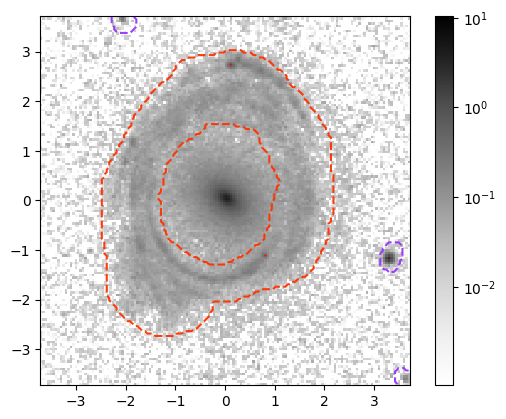

In [3]:

plt.imshow(data, origin='lower', cmap='Grays', extent=extent, norm=colors.SymLogNorm(linthresh = 0.01, vmax = 10.5, vmin = 1e-4))
plt.colorbar();
plt.contour(mask, levels=[0.5], colors='#ff3300', alpha = 0.95, linestyles='dashed', origin='lower', extent=extent)
plt.contour(mask_out, levels=[0.5], colors='#9933ff', alpha = 0.95, linestyles='dashed', origin='lower', extent=extent)
plt.plot(conj_points[:, 0], conj_points[:, 1], 'o', alpha = 0.5, markersize = 1, color='red')

In [4]:
mass_model = MassModel(['EPL', 'SHEAR'])

lens_light_model = LightModel(['GAUSSIAN_ELLIPSE'] * N_gauss_light)

source_light_model = LightModel(['GAUSSIAN_ELLIPSE'] * N_gauss_source)

ss_factor = 4

lens_image = LensImageExtension(
    pixel_grid,
    psf,
    noise_class=noise,
    lens_light_model_class=lens_light_model,
    lens_mass_model_class=mass_model,
    source_model_class=source_light_model,
    source_arc_mask=mask,
    conjugate_points=conj_points,
    kwargs_numerics={'supersampling_factor': ss_factor},
    source_grid_scale = source_grid_scale
)

In [5]:
npix = int(mask_out.sum())
def model(data, N_gauss_light=N_gauss_light, conj = True, provided_rms = False):
    ny, nx = data.shape
    mass_params = EPL_w_shear('Mass model', '1')
    lens_light = gauss_light('Lens light', 'lens', N_gauss_light, sigma_lims = sigma_lims_lens,center_low=-0.5,center_high=0.5)

    conj_points = lens_image.trace_conjugate_points(mass_params)
    conj_mean = conj_points.mean(axis=0)
    source_light = gauss_light('Source light', 'source', N_gauss_source, sigma_lims,)

    conj_distance = reduced_distance_matrix(conj_points)
    nc = conj_distance.shape[0]

    if conj:
        with numpyro.plate(f'Conjugate points 2 - [{nc}]', nc):
            numpyro.sample('conjugate_points', dist.Exponential(1000), obs=conj_distance)

    model_image = lens_image.model(kwargs_lens=mass_params, kwargs_source=source_light, kwargs_lens_light=lens_light, source_add=True)

    #background_rms_model = numpyro.deterministic('RMS', jnp.array([rms]))
    if provided_rms:
        model_std = rms_file
    else:
        background_rms_model = numpyro.sample('RMS', dist.LogUniform(rms * 0.5, rms * 1.5))
        #lens_image.Noise._background_rms = background_rms_model
        model_var = lens_image.Noise.C_D_model(model_image, background_rms = background_rms_model)
        model_std = jnp.sqrt(model_var)


    model_image_masked_out = model_image[mask_out]
    model_std_masked_out = model_std[mask_out]
    with numpyro.plate(f'Data masked - [{npix}]', npix):
        numpyro.sample('obs', dist.Normal(model_image_masked_out, model_std_masked_out), obs=data[mask_out])


def params2kwargs(params, fixed_params={}):
    params_full = params | fixed_params
    kwargs_lens = params2kwargs_EPL_w_shear(params_full, '1')
    center = lens_image.trace_conjugate_points(kwargs_lens).mean(axis=0)
    kwargs_lens_light = params2kwargs_gauss_light(params_full, 'lens', N_gauss_light, sigma_lims_lens)
    return {
        'kwargs_lens': kwargs_lens,
        'kwargs_source': params2kwargs_gauss_light(params_full, 'source', N_gauss_source,sigma_lims),
        'kwargs_lens_light': kwargs_lens_light
    }

model_graph = numpyro.render_model(model, model_args=(data,), render_distributions=True)
#model_graph.unflatten(stagger=2)

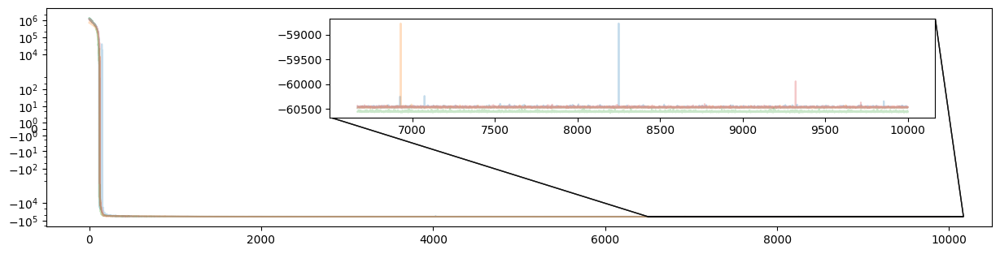

In [6]:
max_iterations = 10000
num_chains = 4

init_fun = infer.init_to_median(num_samples=25)
guide = autoguide.AutoLowRankMultivariateNormal(model, init_loc_fn=init_fun)
scheduler = split_scheduler(max_iterations, init_value=0.01, transition_steps=[200, 10])
optim = optax.adabelief(learning_rate=scheduler)
loss = infer.TraceMeanField_ELBO(num_particles=1)
svi = infer.SVI(model, guide, optim, loss)

@jax.vmap
def map_svi(key):
    return svi.run(key, max_iterations, data, progress_bar=False, stable_update=True)
rng_key = jax.random.PRNGKey(100)
rng_key, rng_key_ = jax.random.split(rng_key)
svi_keys = jax.random.split(rng_key_, num_chains)
multi_svi_results = map_svi(svi_keys)
multi_svi_median = guide.median(multi_svi_results.params)
multi_svi_median_herc = median_params2kwargs(params2kwargs, multi_svi_median, jnp.arange(num_chains))
_, ax = plt.subplots(figsize=(15, 3.5))
axins = ax.inset_axes([0.3, 0.5, 0.64, 0.45])

for losses in multi_svi_results.losses:
    _ = plot_loss(losses, max_iterations, ax=ax, axins=axins, alpha=0.25)

<Figure size 640x480 with 0 Axes>

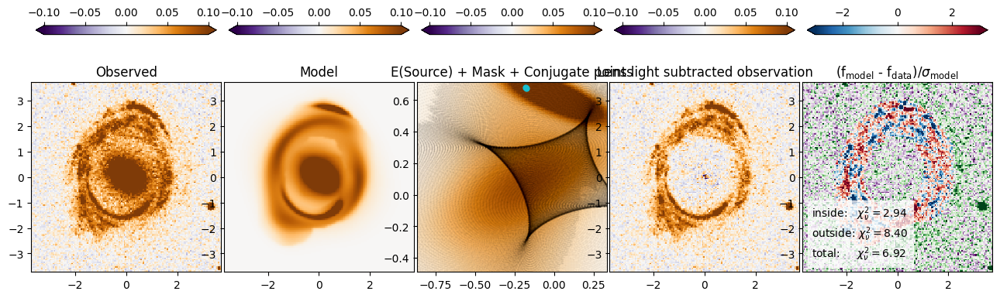

<Figure size 640x480 with 0 Axes>

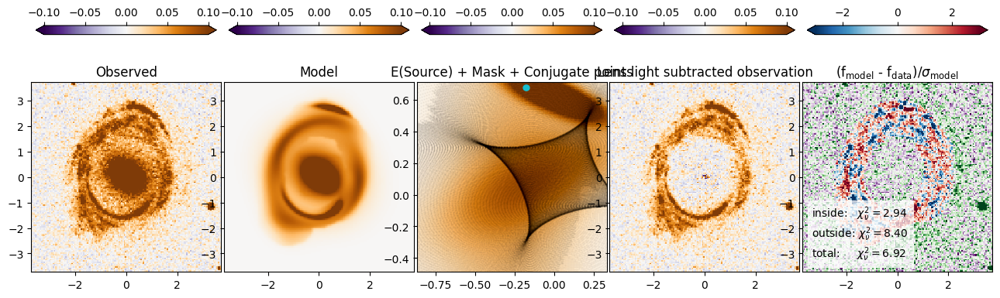

<Figure size 640x480 with 0 Axes>

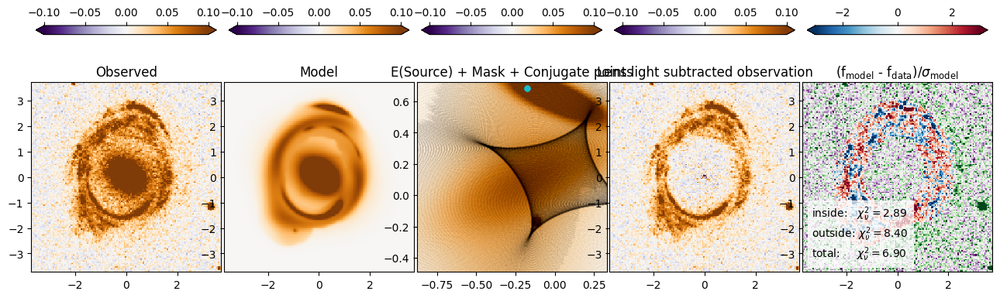

<Figure size 640x480 with 0 Axes>

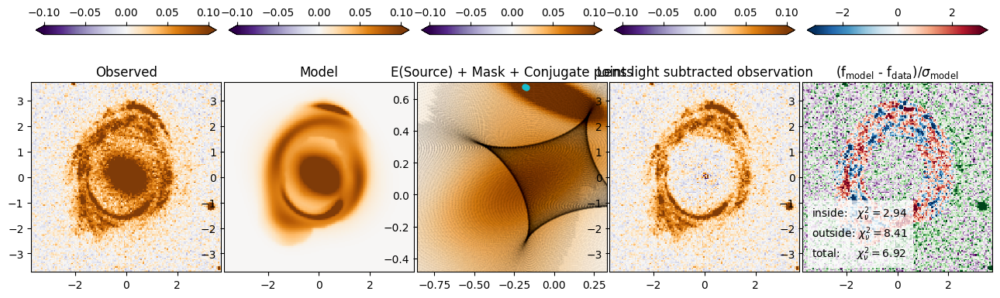

In [7]:
for i in range(4):
    plt.figure()
    #plotter = Plotter(data,lens_image,get_value_from_index(multi_svi_median_herc, i),sigma_obs=rms_file, RMS = rms, alpha = 0.001)
    plotter = Plotter(data,lens_image,get_value_from_index(multi_svi_median_herc, i), RMS = rms, alpha = 0.05)
    fig = plot_all(plotter, halfrange=halfrange, residual_range=3)
    #plt.savefig('/mnt/lustre/tianli/slice_hmc/'+filename+'para_svi'+str(i)+'.png', bbox_inches='tight', pad_inches=0)

In [8]:
best_pix_sizes = np.array([
    get_best_pixel_size(
        lens_image,
        get_value_from_index(multi_svi_median_herc, i),
        source_grid_scale
    ) for i in range(num_chains)
])
pixel_grid_shape = np.median(best_pix_sizes).astype(int)
print(pixel_grid_shape)
#pixel_grid_shape = 140

99


In [9]:
vars_mass = ['theta_E_1', 'gamma_1', 'e_1', 'center_1', 'gamma_sheer_1']
vars_lens_light = ['A_lens', 'sigma_lens','e_lens', 'center_lens']
vars_source_light = ['A_source', 'sigma_source', 'e_source']
vars_other = ['RMS']

svi_samples = guide.sample_posterior(rng_key_, multi_svi_results.params, sample_shape=(1000,))
svi_samples_chains = jax.tree_map(lambda x: jnp.swapaxes(x, 0, 1), svi_samples)
svi_samples_chains = jax.device_get(svi_samples_chains)
multi_svi_guide_sample = az.from_dict(svi_samples_chains)

k_grid = K_grid((pixel_grid_shape, pixel_grid_shape))

@jax.vmap
def get_image(idx):
    i, _ = pixelize_plane_single(lens_image, get_value_from_index(multi_svi_median_herc, idx), pixel_grid_shape, source_grid_scale=source_grid_scale)
    return i

orig_source = get_image(jnp.arange(num_chains))
ps_keys = jax.random.split(rng_key_, num_chains)
ps_fits = source_power_spectrum(orig_source, ps_keys)

multi_svi_median_pixelated = {k: multi_svi_median[k] for k in vars_lens_light + vars_mass + vars_other} | ps_fits

In [10]:
k_grid = K_grid((pixel_grid_shape, pixel_grid_shape))

mass_model_pixel = MassModel(['EPL', 'SHEAR'])
lens_light_model_pixel = LightModel(['GAUSSIAN_ELLIPSE'] * N_gauss_light)

source_light_model_pixel = LightModel(
    ['PIXELATED'],
    pixel_adaptive_grid=True,
    pixel_interpol='fast_bilinear',
    kwargs_pixelated={'num_pixels': pixel_grid_shape}
)

lens_image_pixel = LensImageExtension(
    deepcopy(pixel_grid),
    deepcopy(psf),
    noise_class=noise,
    lens_light_model_class=lens_light_model_pixel,
    lens_mass_model_class=mass_model_pixel,
    source_model_class=source_light_model_pixel,
    #source_arc_mask=mask,
    source_arc_mask=jnp.ones_like(data, dtype=bool),
    conjugate_points=conj_points,
    kwargs_numerics={'supersampling_factor': ss_factor},
    source_grid_scale=source_grid_scale,
)

In [11]:
npix = int(mask_out.sum())
def model_pixel_full(data, k_values, N_gauss_light=N_gauss_light, conj=False):
    ny, nx = data.shape
    mass_params = EPL_w_shear('Mass model', '1')
    lens_light = gauss_light(
        'Lens light',
        'lens',
        N_gauss_light,
        sigma_lims_lens,
        center_low=-0.5,
        center_high=0.5
    )
    
    if conj:
        conj_points = lens_image_pixel.trace_conjugate_points(mass_params)
        conj_distance = reduced_distance_matrix(conj_points)
        nc = conj_distance.shape[0]
        with numpyro.plate(f'Conjugate points 2 - [{nc}]', nc):
            numpyro.sample('conjugate_points', dist.Exponential(1000), obs=conj_distance)

    source_light = [
        matern_power_spectrum('Source grid', 'source_grid', k_values)
    ]

    model_image = lens_image_pixel.model(
        kwargs_lens=mass_params,
        kwargs_source=source_light,
        kwargs_lens_light=lens_light
    )
    #background_rms_model = numpyro.deterministic('RMS', jnp.array([rms]))
    background_rms_model = numpyro.sample('RMS', dist.LogUniform(rms * 0.5, rms * 1.5))
    #lens_image.Noise._background_rms = background_rms_model
    model_var = lens_image.Noise.C_D_model(model_image, background_rms = background_rms_model)
    model_std = jnp.sqrt(model_var)

    # with numpyro.plate(f'Data x - [{nx}]', nx):
    #     with numpyro.plate(f'Data y - [{ny}]', ny):
    #         numpyro.sample('obs', dist.Normal(model_image, model_std), obs=data)
            
    model_image_masked_out = model_image[mask_out]
    model_std_masked_out = model_std[mask_out]
    with numpyro.plate(f'Data masked - [{npix}]', npix):
        numpyro.sample('obs', dist.Normal(model_image_masked_out, model_std_masked_out), obs=data[mask_out])


def params2kwargs_pixel(params, fixed_params={}):
    params_full = params | fixed_params
    kwargs_lens = params2kwargs_EPL_w_shear(params_full, '1')
    kwargs_source = [params2kwargs_power_spectrum(params, 'source_grid')]
    kwargs_lens_light = params2kwargs_gauss_light(params_full, 'lens', N_gauss_light, sigma_lims_lens)
    return {
        'kwargs_lens': kwargs_lens,
        'kwargs_source': kwargs_source,
        'kwargs_lens_light': kwargs_lens_light
    }

model_graph = numpyro.render_model(
    model_pixel_full,
    model_args=(data, k_grid.k),
    model_kwargs={'conj': False},
    render_distributions=True
)
#model_graph.unflatten(stagger=2)

[2025-05-15 11:43:10] running
[2025-05-15 11:45:10] running
[2025-05-15 11:47:10] running
程序运行了 360.003 秒


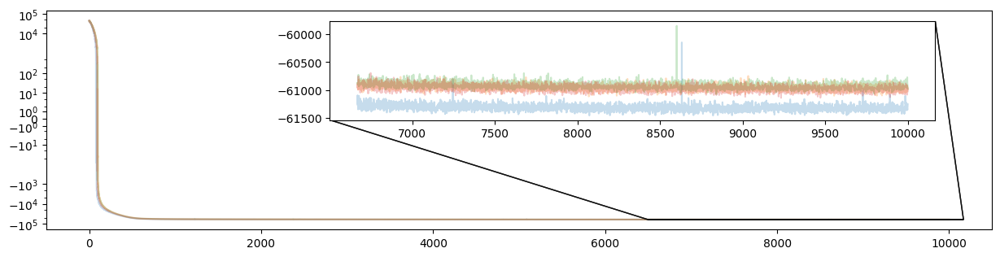

In [12]:
import time
import threading

def periodic_printer(interval, stop_event):
    while not stop_event.is_set():
        time.sleep(interval)
        print(f"[{time.strftime('%Y-%m-%d %H:%M:%S')}] running")
        
stop_event = threading.Event()
printer_thread = threading.Thread(target=periodic_printer, args=(120, stop_event), daemon=True)
printer_thread.start()
start = time.time()

max_iterations = 10000
num_chains = 4

init_fun = init_to_value_or_defer(values=get_value_from_index(multi_svi_median_pixelated, 1))
guide_pixel = autoguide.AutoLowRankMultivariateNormal(model_pixel_full,init_loc_fn=init_fun,init_scale=0.01)

scheduler = split_scheduler(max_iterations,init_value=0.001,transition_steps=[200, 10])
optim = optax.adabelief(learning_rate=scheduler)
loss = infer.TraceMeanField_ELBO()

@jax.vmap
def map_svi_pixel(key, i):
    init_fun = init_to_value_or_defer(values=get_value_from_index(multi_svi_median_pixelated, i))
    guide_pixel.init_loc_fn = init_fun
    svi_pixel = infer.SVI(model_pixel_full,guide_pixel,optim,loss)
    return svi_pixel.run(key, max_iterations, data, k_grid.k, conj=True, progress_bar=False, stable_update=True)

svi_keys = jax.random.split(rng_key_, num_chains)
multi_svi_pixel_results = map_svi_pixel(svi_keys, jnp.arange(num_chains))
multi_svi_pixel_median = guide_pixel.median(multi_svi_pixel_results.params)
multi_svi_pixel_median_herc = median_params2kwargs(params2kwargs_pixel,multi_svi_pixel_median,jnp.arange(num_chains))

stop_event.set()
printer_thread.join()
end = time.time()
print(f"程序运行了 {end - start:.3f} 秒")

_, ax = plt.subplots(figsize=(15, 3.5))
axins = ax.inset_axes([0.3, 0.5, 0.64, 0.45])

for losses in multi_svi_pixel_results.losses:
    _ = plot_loss(losses, max_iterations, ax=ax, axins=axins, alpha=0.25)

<Figure size 640x480 with 0 Axes>

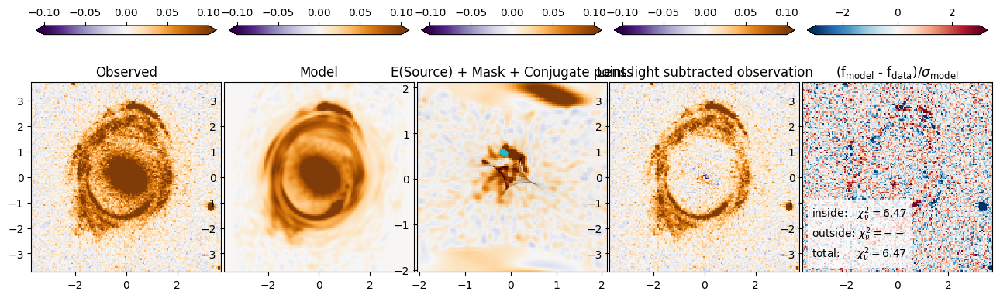

<Figure size 640x480 with 0 Axes>

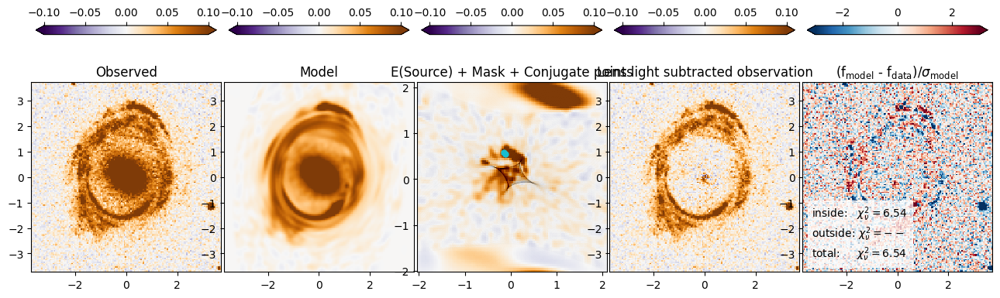

<Figure size 640x480 with 0 Axes>

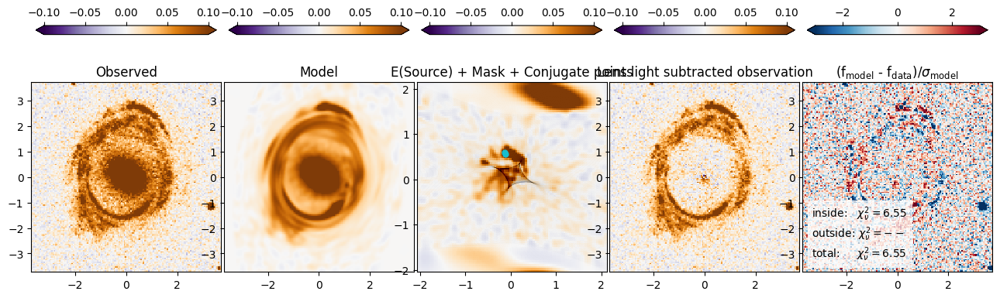

<Figure size 640x480 with 0 Axes>

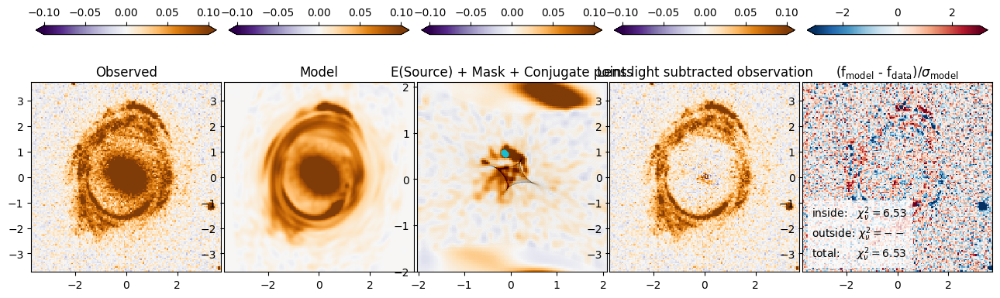

In [13]:
best_i = int(multi_svi_pixel_results.losses[:, -1000:].mean(axis=1).argmin())
best_n = jnp.median(multi_svi_pixel_median['n_source_grid'])

for i in range(4):
    plt.figure()
    plotter_pixel = Plotter(
        data,
        lens_image_pixel,
        get_value_from_index(multi_svi_pixel_median_herc, i),
        RMS=rms,
        alpha = 0.005
    )
    fig = plot_all(plotter_pixel, halfrange=halfrange, residual_range=3, npix=pixel_grid_shape)
    #plt.savefig('/mnt/lustre/tianli/slice_hmc/'+filename+'pixel_svi'+str(i)+'.png', bbox_inches='tight', pad_inches=0)

### Corner plot

In [14]:
vars_power = ['n_source_grid', 'rho_source_grid', 'sigma_source_grid']

svi_samples_pixel = guide_pixel.sample_posterior(rng_key_, multi_svi_pixel_results.params, sample_shape=(1000,))
svi_samples_pixel_chains = jax.tree_map(lambda x: jnp.swapaxes(x, 0, 1), svi_samples_pixel)
svi_samples_pixel_chains = jax.device_get(svi_samples_pixel_chains)
multi_svi_guide_sample_pixel = az.from_dict(svi_samples_pixel_chains)


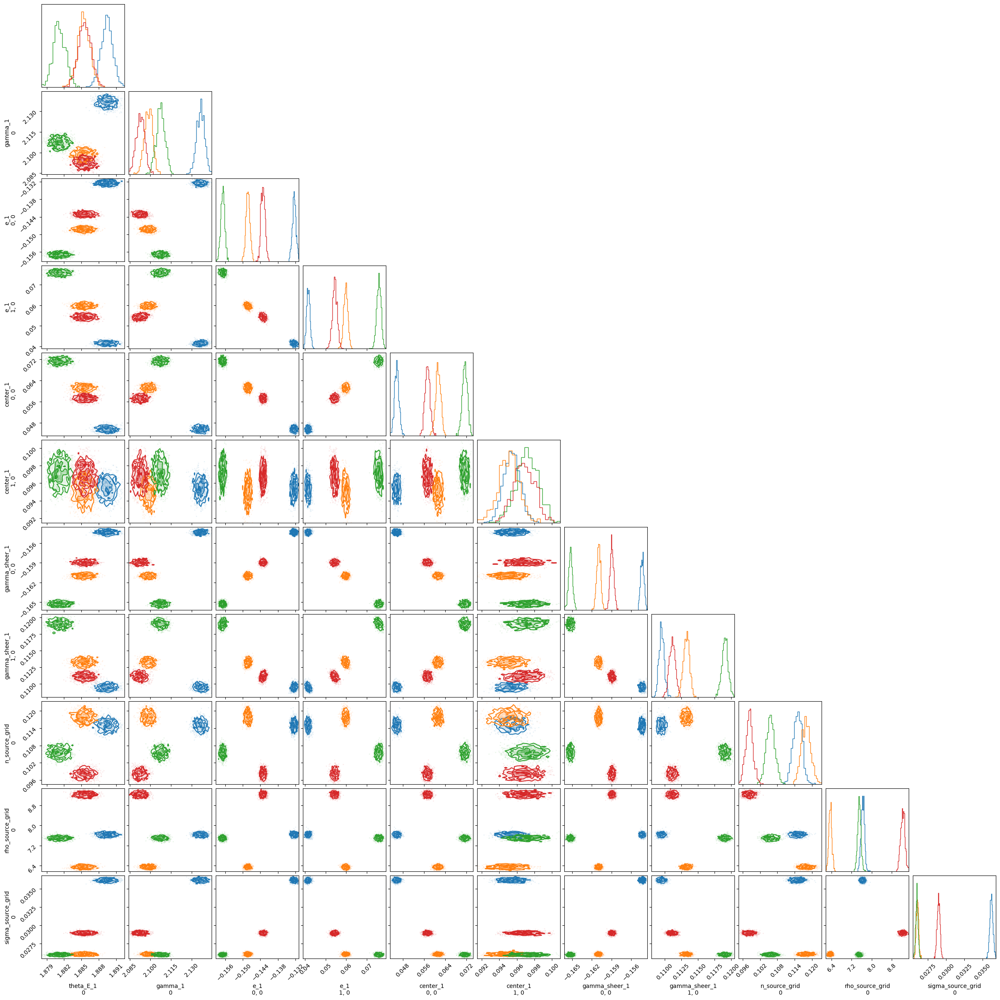

In [20]:
fig_corner = None
for i in range(num_chains):
    fig_corner = corner(
        multi_svi_guide_sample_pixel.isel(chain=i),
        var_names=vars_mass+vars_power,
        color=f'C{i}',
        fig=fig_corner,
        # hist_kwargs={'density': True}
    )

In [16]:
vars_fixed = vars_lens_light 
svi_pixel_median = get_value_from_index(multi_svi_pixel_median, best_i)
fixed_params_pixel = {k:svi_pixel_median[k] for k in vars_fixed}
model_pixel_hmc_new = condition(model_pixel_full, fixed_params_pixel)

## HMC of the pixel grid model

As with the SVI we can extend the HMC to the full pixel grid model.  Keeping the lens light and parameterized source light fixed at the parameterized SVI solution, and initialize the model with the pixelated SVI solution.  Given the complex 

In [17]:
vars_pixel = ['pixels_wn_source_grid']
multi_svi_pixel_median_vars = {k: multi_svi_pixel_median[k] for k in vars_mass + vars_power + vars_pixel + vars_other + ['RMS']}
unconstrined_svi_pixel_median = jax.vmap(lambda p: infer.util.unconstrain_fn(model_pixel_hmc_new, (data, k_grid.k), {}, p))(multi_svi_pixel_median_vars)
#unconstrined_svi_pixel_median_trim = get_value_from_indexs(unconstrined_svi_pixel_median, jnp.array([2, 5, 8, 4]))
svi_std = multi_svi_guide_sample_pixel.posterior.std(dim=['chain', 'draw'])

unconstrined_svi_pixel_median = {k: v.astype(jnp.float64) for k, v in unconstrined_svi_pixel_median.items()}
svi_std['RMS'].data = jnp.array(svi_std['RMS'].data, dtype=jnp.float64)
rng_key, rng_key_ = jax.random.split(rng_key)

In [18]:
lens_light = params2kwargs_gauss_light(get_value_from_index(multi_svi_pixel_median, best_i),'lens', N_gauss_light,sigma_lims_lens)

In [19]:
###### npix = int(mask_out.sum())
def params2kwargs_pixel(params, fixed_params={}):
    params_full = params | fixed_params
    kwargs_lens = params2kwargs_EPL_w_shear(params_full, '1')
    kwargs_source = [params2kwargs_power_spectrum(params, 'source_grid')]
    kwargs_lens_light = lens_light
    #kwargs_lens_light = params2kwargs_gauss_light(params_full, 'lens', N_gauss_light, sigma_lims_lens)
    return {
        'kwargs_lens': kwargs_lens,
        'kwargs_source': kwargs_source,
        'kwargs_lens_light': kwargs_lens_light
    }

## Double Gibbs Class

In [37]:
from numpyro.infer import NUTS, MCMC
from custom_gibbs import MultiHMCGibbs

init_fun_pixel = init_to_value_or_defer(values=get_value_from_index(multi_svi_pixel_median, 0))

inner_kernels = [
    NUTS(
        model_pixel_hmc_new,
        init_strategy=init_fun_pixel,
        target_accept_prob=0.95,
        max_tree_depth=10,
        dense_mass=[('n_source_grid', 'rho_source_grid', 'sigma_source_grid')],
        inverse_mass_matrix={
            ('pixels_wn_source_grid', ): jnp.array(svi_std.pixels_wn_source_grid.data.flatten()),
            ('n_source_grid', 'rho_source_grid', 'sigma_source_grid'): jnp.diag(jnp.hstack([
                svi_std.n_source_grid.data,
                svi_std.rho_source_grid.data,
                svi_std.sigma_source_grid.data
            ])),
        }
    ),
    NUTS(
        model_pixel_hmc_new,
        init_strategy=init_fun_pixel,
        target_accept_prob=0.95,
        max_tree_depth=10,
        dense_mass=[('center_1',), ('theta_E_1',), ('e_1', 'gamma_1', 'gamma_sheer_1')],
        inverse_mass_matrix={
            ('RMS',): jnp.array(svi_std.RMS.data.reshape(1)),
            ('center_1',): jnp.diag(jnp.array(svi_std.center_1.data.flatten())),
            ('theta_E_1',): jnp.array(svi_std.theta_E_1.data),
            ('e_1', 'gamma_1', 'gamma_sheer_1'): jnp.diag(jnp.hstack([
                svi_std.e_1.data.flatten(),
                svi_std.gamma_1.data,
                svi_std.gamma_sheer_1.data.flatten(),
            ]))
        }
    ),
    # NUTS(
    #     model_pixel_full,
    #     init_strategy=init_fun_pixel,
    #     target_accept_prob=0.8,
    #     max_tree_depth=10,
    #     dense_mass=False,
    #     inverse_mass_matrix={
    #         ('A_lens', 'center_lens', 'e_lens', 'sigma_lens'): jnp.hstack([
    #             svi_std.A_lens.data,
    #             svi_std.center_lens.data.flatten(),
    #             svi_std.e_lens.data.flatten(),
    #             svi_std.sigma_lens.data,
    #         ])
    #     }
    # )
]

outer_kernel = MultiHMCGibbs(
    inner_kernels,
    gibbs_sites_list=[vars_pixel+vars_power, vars_mass + vars_other]
)

mcmc_pixel = MCMC(
    outer_kernel,
    num_warmup=10,
    num_samples=20,
    num_chains=num_chains,
    progress_bar=True,
    # chain_method='sequential'
    chain_method='vectorized'
)

batch_number = 2
last_states = []
batch_list = []
for i in range(batch_number):
    print(f'Batch {i+1}/{batch_number}')
    if i == 0:
        mcmc_pixel.run(
            rng_key_,
            data,
            k_grid.k,
            conj=False,
            init_params=unconstrined_svi_pixel_median
        )
        last_states.append(jax.device_get(mcmc_pixel.last_state))
    else:
        mcmc_pixel.post_warmup_state = mcmc_pixel.last_state
        mcmc_pixel.run(
            mcmc_pixel.post_warmup_state.rng_key,
            data,
            k_grid.k,
            conj=False
        )
        last_states.append(jax.device_get(mcmc_pixel.last_state))

    mcmc_pixel._states = jax.device_get(mcmc_pixel._states)
    mcmc_pixel._states_flat = jax.device_get(mcmc_pixel._states_flat)
    mcmc_chain = az.from_numpyro(mcmc_pixel)
    mcmc_chain.to_netcdf("/mnt/lustre/tianli/slice_hmc/"+filename+"jupyter_herculens3"+str(i)+".nc")
    batch_list.append(az.from_numpyro(mcmc_pixel))



Batch 1/2


sample: 100%|██████████| 30/30 [07:41<00:00, 15.39s/it]


Batch 2/2


sample: 100%|██████████| 20/20 [07:01<00:00, 21.07s/it]


In [20]:
batch_list = []
for i in range(4):
    current_batch = az.from_netcdf("/mnt/lustre/tianli/slice_hmc/EHJlens_F606.fitsherculens3"+str(i)+".nc")
    batch_list.append(current_batch)
    
inf_data_pixel = az.concat(*batch_list, dim='draw')
vars_mass = ['theta_E_1', 'gamma_1', 'e_1', 'center_1', 'gamma_sheer_1']
vars_lens_light = ['A_lens', 'sigma_lens','e_lens', 'center_lens']
vars_source_light = ['A_source', 'sigma_source', 'e_source']
vars_other = ['RMS']
vars_power = ['n_source_grid', 'rho_source_grid', 'sigma_source_grid']
print(f'divergences per chain per step:\n {inf_data_pixel.sample_stats.diverging.values.sum(axis=1).T}')
#az.summary(inf_data_pixel, var_names=vars_mass + vars_power + vars_other)
az.summary(inf_data_pixel.sel(chain=np.array([0,1,2,3])), var_names=vars_mass + vars_power + vars_other)

divergences per chain per step:
 [[ 914 1012  944 1170]
 [   0    0    0    0]]


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
theta_E_1[0],1.913,0.001,1.910,1.915,0.000,0.000,211.0,361.0,1.02
gamma_1[0],2.318,0.013,2.293,2.343,0.001,0.001,159.0,350.0,1.04
"e_1[0, 0]",-0.057,0.004,-0.065,-0.048,0.000,0.000,87.0,188.0,1.05
"e_1[1, 0]",-0.087,0.003,-0.093,-0.080,0.000,0.000,142.0,255.0,1.04
"center_1[0, 0]",0.055,0.002,0.051,0.059,0.000,0.000,96.0,198.0,1.03
"center_1[1, 0]",0.043,0.001,0.040,0.046,0.000,0.000,346.0,809.0,1.01
"gamma_sheer_1[0, 0]",-0.119,0.002,-0.122,-0.115,0.000,0.000,86.0,181.0,1.04
"gamma_sheer_1[1, 0]",0.066,0.002,0.062,0.069,0.000,0.000,161.0,297.0,1.04
n_source_grid[0],57.750,20.726,19.727,90.718,0.450,0.268,2078.0,2046.0,1.00
rho_source_grid[0],0.236,0.055,0.131,0.338,0.002,0.001,844.0,848.0,1.00


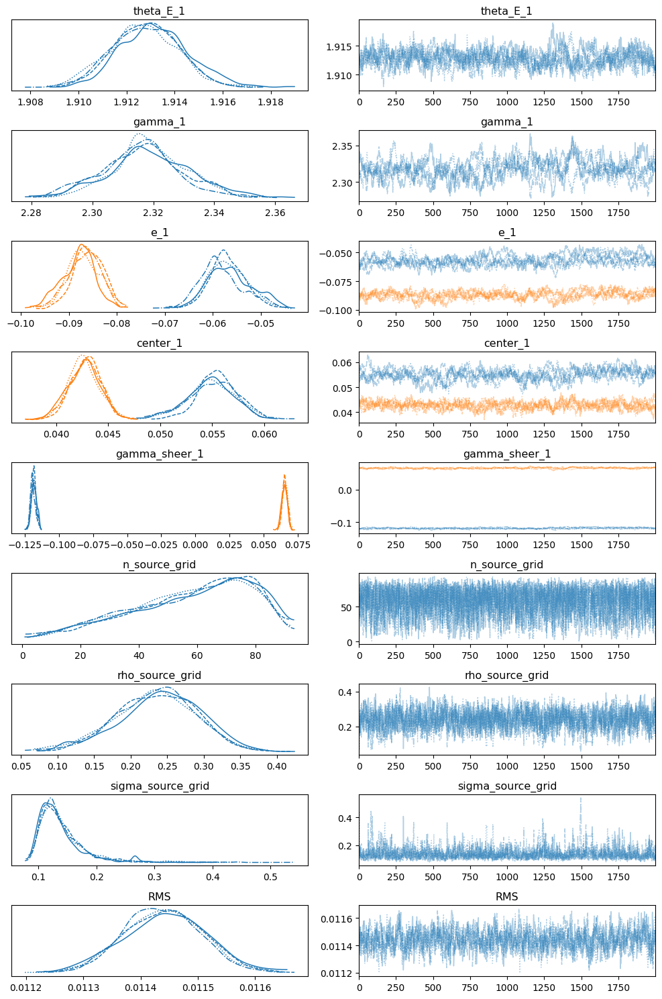

In [21]:
plt.rcParams['figure.constrained_layout.use'] = True
_ = az.plot_trace(inf_data_pixel, var_names=vars_mass + vars_power + vars_other , figsize=(10, 15))
plt.tight_layout()

In [ ]:
pix_r_hat = az.rhat(inf_data_pixel, var_names=vars_pixel)
plt.imshow(pix_r_hat.pixels_wn_source_grid.data, vmax=1.04)
plt.colorbar();

In [22]:
hmc_median_pixel = inf_data_pixel.posterior.median(dim=('chain', 'draw'))
hmc_std_pixel = inf_data_pixel.posterior.std(dim=('chain', 'draw'))

hmc_median_pixel = {k: v.data for k, v in hmc_median_pixel.data_vars.items()}
hmc_median_pixel_herc = params2kwargs_pixel(hmc_median_pixel)#, fixed_params=fixed_params_pixel)

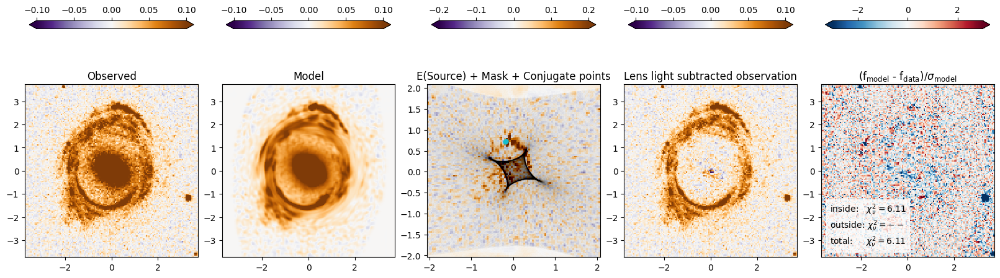

In [30]:
plotter_pixel = Plotter(data, lens_image_pixel, hmc_median_pixel_herc, RMS=hmc_median_pixel['RMS'], alpha = 0.01)
fig = plot_all(plotter_pixel, halfrange=[0.1, 0.2, 0.1], residual_range=3, npix=pixel_grid_shape)

In [24]:
hmc_median_pixel_by_chain = inf_data_pixel.posterior.median(dim=('draw'))

hmc_median_pixel_by_chain = {k: v.data for k, v in hmc_median_pixel_by_chain.data_vars.items()}
hmc_median_pixel_herc_by_chian = median_params2kwargs(
    partial(params2kwargs_pixel),
    hmc_median_pixel_by_chain,
    jnp.arange(num_chains)
)



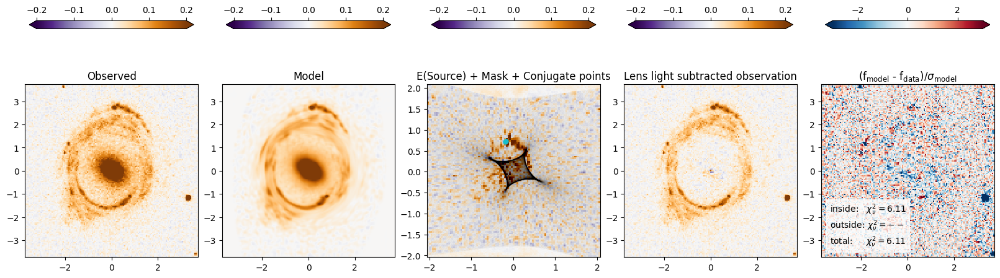

In [25]:
i = 0

plotter_pixel = Plotter(
    data,
    lens_image_pixel,
    get_value_from_index(hmc_median_pixel_herc_by_chian, i),
    RMS=hmc_median_pixel_by_chain['RMS'][i], alpha = 0.01
)
fig = plot_all(plotter_pixel, halfrange=[0.2, 0.2, 0.2], residual_range=3, npix=pixel_grid_shape)
#plt.savefig('/mnt/lustre/tianli/slice_hmc/GIGAlensmodel.pdf', dpi = 300)

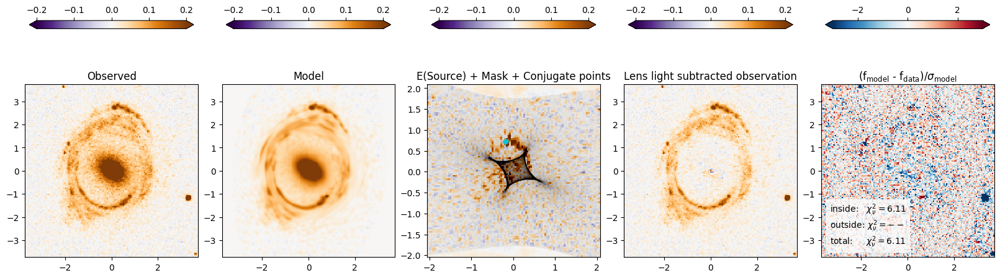

In [26]:
i = 1

plotter_pixel = Plotter(
    data,
    lens_image_pixel,
    get_value_from_index(hmc_median_pixel_herc_by_chian, i),
    RMS=hmc_median_pixel_by_chain['RMS'][i], alpha = 0.01
)
fig = plot_all(plotter_pixel, halfrange=[0.2, 0.2, 0.2], residual_range=3, npix=pixel_grid_shape)

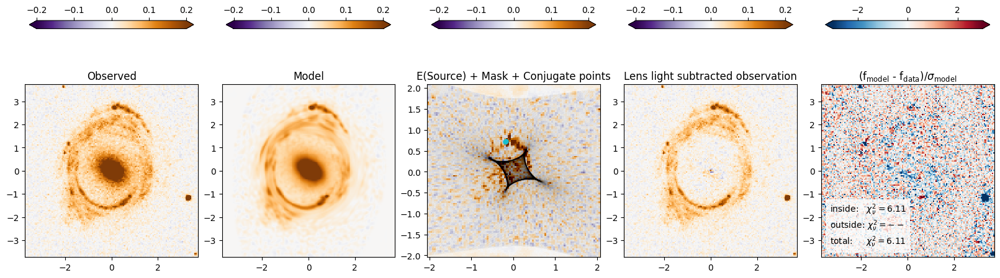

In [27]:
i = 2

plotter_pixel = Plotter(
    data,
    lens_image_pixel,
    get_value_from_index(hmc_median_pixel_herc_by_chian, i),
    RMS=hmc_median_pixel_by_chain['RMS'][i], alpha = 0.01
)
fig = plot_all(plotter_pixel, halfrange=[0.2, 0.2, 0.2], residual_range=3, npix=pixel_grid_shape)

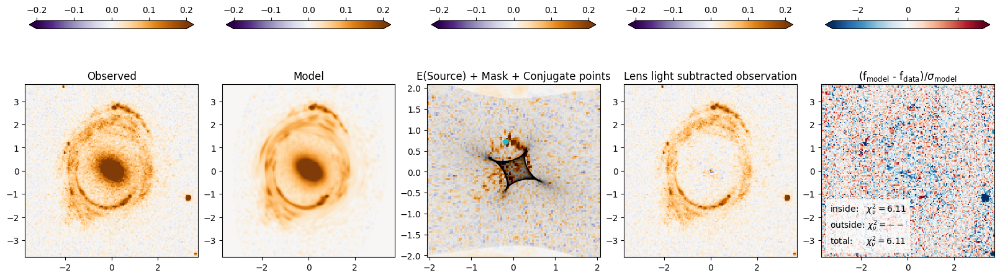

In [28]:
i = 3

plotter_pixel = Plotter(
    data,
    lens_image_pixel,
    get_value_from_index(hmc_median_pixel_herc_by_chian, i),
    RMS=hmc_median_pixel_by_chain['RMS'][i], alpha = 0.01
)
fig = plot_all(plotter_pixel, halfrange=[0.2, 0.2, 0.2], residual_range=3, npix=pixel_grid_shape)

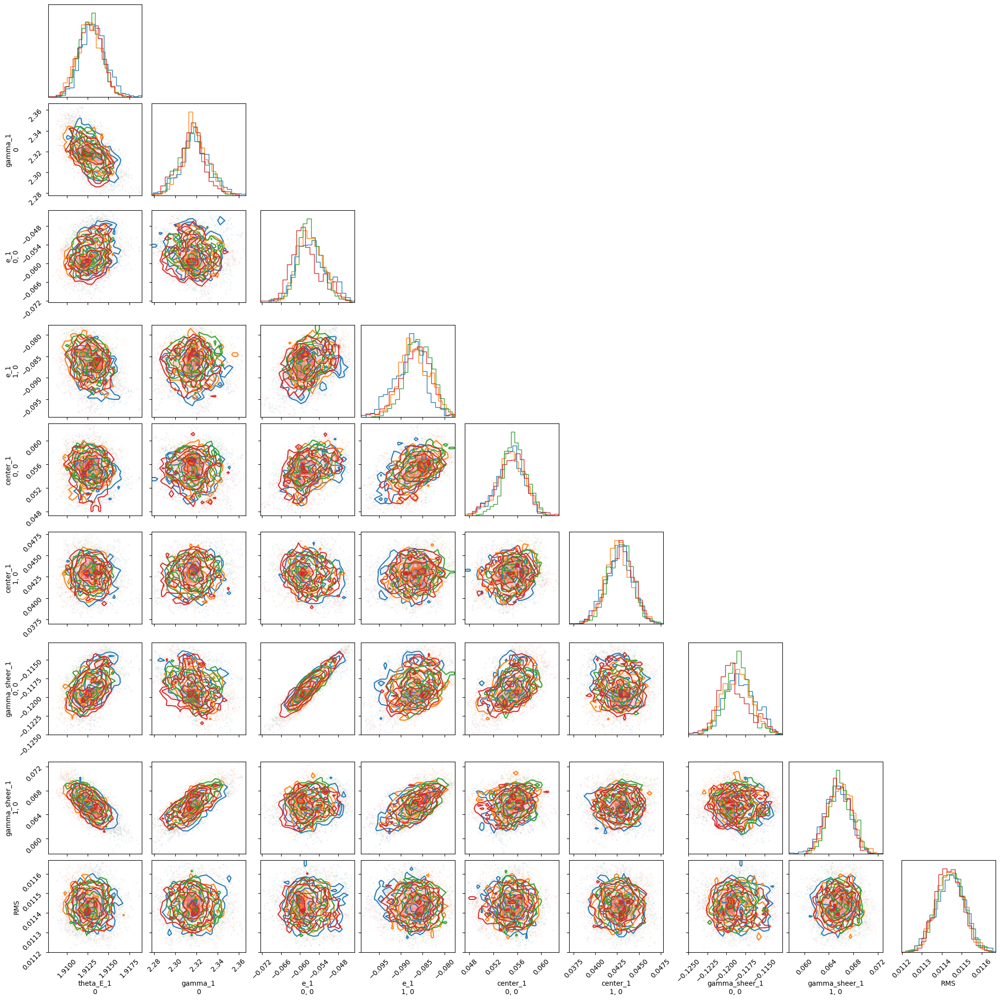

In [29]:
fig_corner = None
for i in range(num_chains):
     fig_corner = corner(
         inf_data_pixel.isel(chain=i),
         var_names=vars_mass + vars_other,
         color = f'C{i}',
         fig=fig_corner,
         hist_kwargs={'density': True}
     )



In [1]:
import arviz as az
import numpy as np
batch_list = []
for i in range(4):
    current_batch = az.from_netcdf("/mnt/lustre/tianli/slice_hmc/EHJlens_F606herculens"+str(i)+".nc")
    batch_list.append(current_batch)
inf_data_pixel = az.concat(*batch_list, dim='draw')
vars_mass = ['theta_E_1', 'gamma_1', 'e_1', 'center_1', 'gamma_sheer_1']
vars_lens_light = ['A_lens', 'sigma_lens','e_lens', 'center_lens']
vars_source_light = ['A_source', 'sigma_source', 'e_source']
vars_other = ['RMS']
vars_power = ['n_source_grid', 'rho_source_grid', 'sigma_source_grid']
print(f'divergences per chain per step:\n {inf_data_pixel.sample_stats.diverging.values.sum(axis=1).T}')
#az.summary(inf_data_pixel, var_names=vars_mass + vars_power + vars_other)
az.summary(inf_data_pixel.sel(chain=np.array([1,2,3])), var_names=vars_mass + vars_power + vars_other)

divergences per chain per step:
 [[0 0 0 0]
 [0 0 0 0]]


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
theta_E_1[0],1.914,0.001,1.911,1.916,0.000,0.000,192.0,832.0,1.03
gamma_1[0],2.239,0.011,2.217,2.259,0.001,0.001,74.0,141.0,1.04
"e_1[0, 0]",-0.062,0.003,-0.068,-0.055,0.000,0.000,138.0,193.0,1.00
"e_1[1, 0]",-0.066,0.002,-0.070,-0.061,0.000,0.000,216.0,315.0,1.02
"center_1[0, 0]",0.057,0.002,0.054,0.060,0.000,0.000,221.0,456.0,1.00
"center_1[1, 0]",0.043,0.001,0.040,0.045,0.000,0.000,267.0,610.0,1.00
"gamma_sheer_1[0, 0]",-0.118,0.002,-0.121,-0.115,0.000,0.000,129.0,220.0,1.02
"gamma_sheer_1[1, 0]",0.065,0.002,0.062,0.067,0.000,0.000,131.0,281.0,1.03
n_source_grid[0],0.590,0.260,0.152,0.996,0.006,0.003,1951.0,1809.0,1.00
rho_source_grid[0],0.183,0.050,0.094,0.279,0.001,0.001,1394.0,2860.0,1.00


/tmp/ipykernel_463493/3734019016.py:5: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


<Figure size 640x480 with 0 Axes>

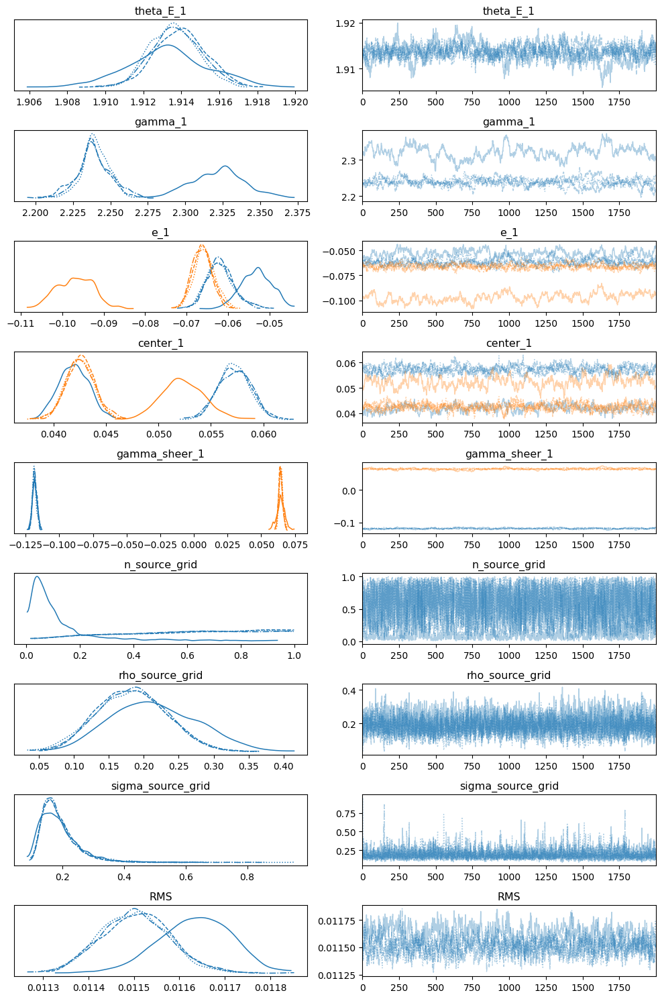

In [3]:
import matplotlib.pyplot as plt
plt.figure()
plt.rcParams['figure.constrained_layout.use'] = True
_ = az.plot_trace(inf_data_pixel, var_names=vars_mass + vars_power + vars_other , figsize=(10, 15))
plt.tight_layout()

/mnt/lustre2/shared_conda/envs/ckraw/gpu_herculens_3/lib/python3.11/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(
/mnt/lustre2/shared_conda/envs/ckraw/gpu_herculens_3/lib/python3.11/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(
/mnt/lustre2/shared_conda/envs/ckraw/gpu_herculens_3/lib/python3.11/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(
/mnt/lustre2/shared_conda/envs/ckraw/gpu_herculens_3/lib/python3.11/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust a

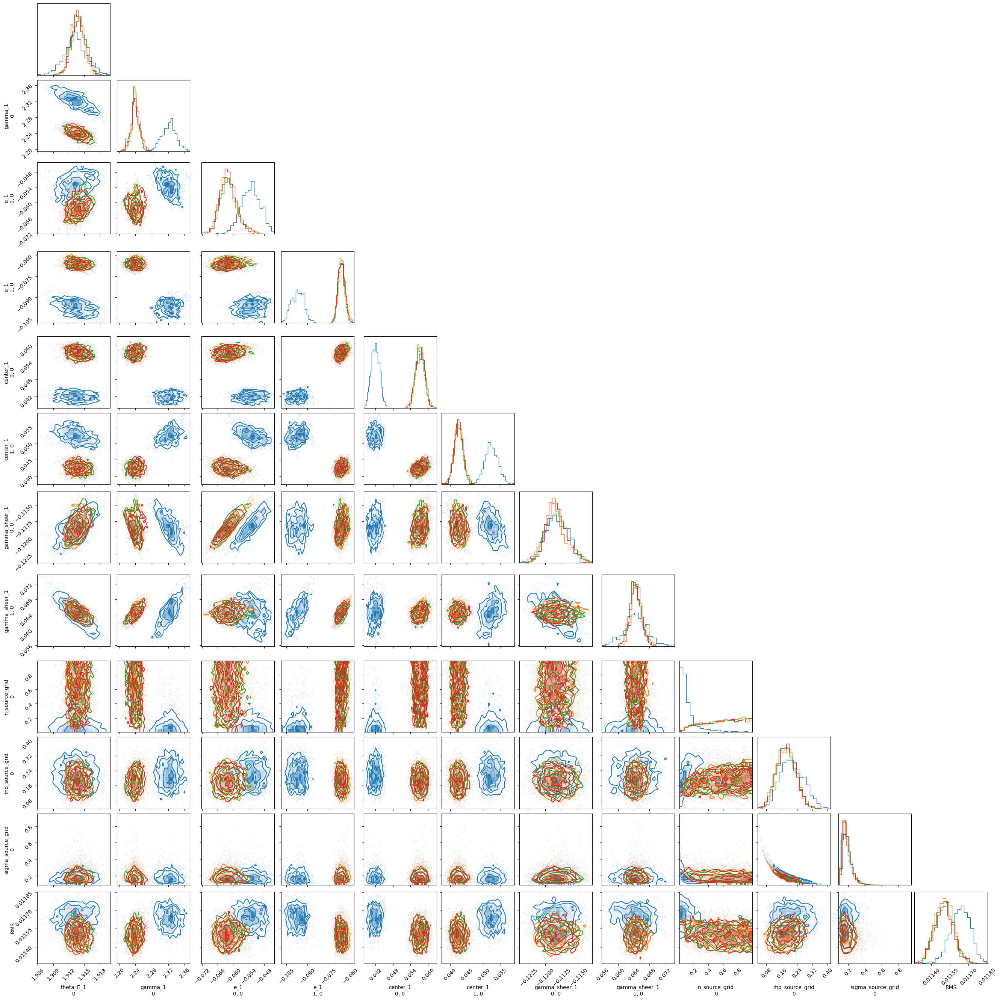

In [8]:
import corner as corner
fig_corner = None
for i in range(4):
     fig_corner = corner.corner(
         inf_data_pixel.isel(chain=i),
         var_names=vars_mass + vars_power+ vars_other,
         color = f'C{i}',
         fig=fig_corner,
         hist_kwargs={'density': True}
     )

